In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from functions import EDA
import pandas as pd
from statsmodels.tsa.stattools import adfuller
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import jarque_bera
from scipy.stats import normaltest

In [2]:
df_sp = pd.read_pickle('data/SP500.pkl')
df_nifty = pd.read_pickle('data/NIFTY50.pkl')
df_ftse = pd.read_pickle('data/FTSE100.pkl')

In [3]:
EDA(df_sp)

/Users/philipnj/anaconda3/lib/python3.11/site-packages/altair/utils/deprecation.py:65: AltairDeprecationWarning: 'add_selection' is deprecated. Use 'add_params' instead.
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)


alt.VConcatChart(...)

In [4]:
EDA(df_nifty)

/Users/philipnj/anaconda3/lib/python3.11/site-packages/altair/utils/deprecation.py:65: AltairDeprecationWarning: 'add_selection' is deprecated. Use 'add_params' instead.
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)


alt.VConcatChart(...)

In [5]:
EDA(df_ftse)

/Users/philipnj/anaconda3/lib/python3.11/site-packages/altair/utils/deprecation.py:65: AltairDeprecationWarning: 'add_selection' is deprecated. Use 'add_params' instead.
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)


alt.VConcatChart(...)

In [6]:
df_sp.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'daily_return',
       'cumulative_return'],
      dtype='object')

In [7]:
df_corr = pd.DataFrame()
df_corr['SP500'] = df_sp['Close']
df_corr['NIFTY50'] = df_nifty['Close']
df_corr['FTSE100'] = df_ftse['Close']
df_corr['SP500_return'] = df_sp['Close'].pct_change()
df_corr['NIFTY50_return'] = df_nifty['Close'].pct_change()
df_corr['FTSE100_return'] = df_ftse['Close'].pct_change()


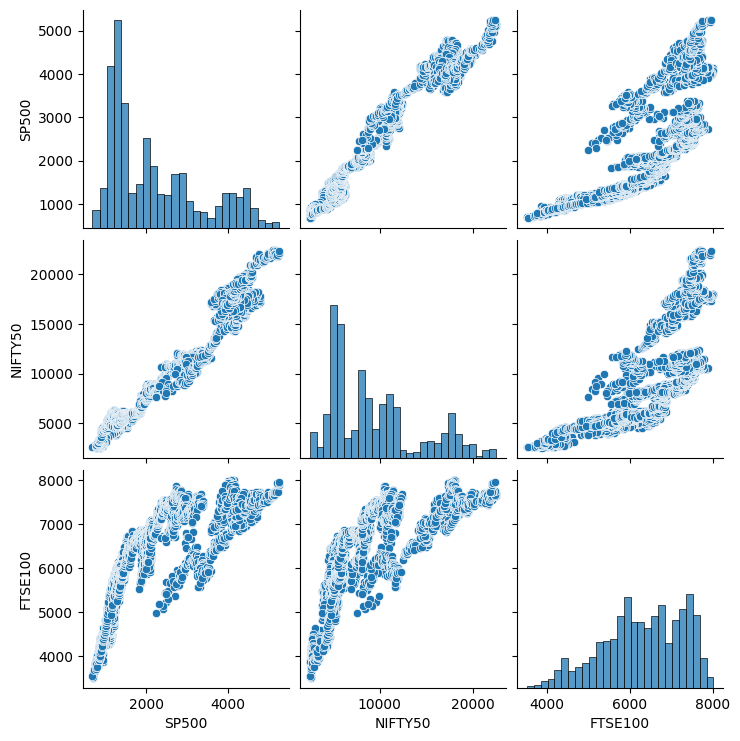

In [8]:
sns.pairplot(df_corr[['SP500', 'NIFTY50', 'FTSE100']])


In [9]:
display(round(df_corr[['SP500', 'NIFTY50', 'FTSE100']].corr(),2))

,SP500,NIFTY50,FTSE100
SP500,1.00,0.98,0.77
NIFTY50,0.98,1.00,0.76
FTSE100,0.77,0.76,1.00


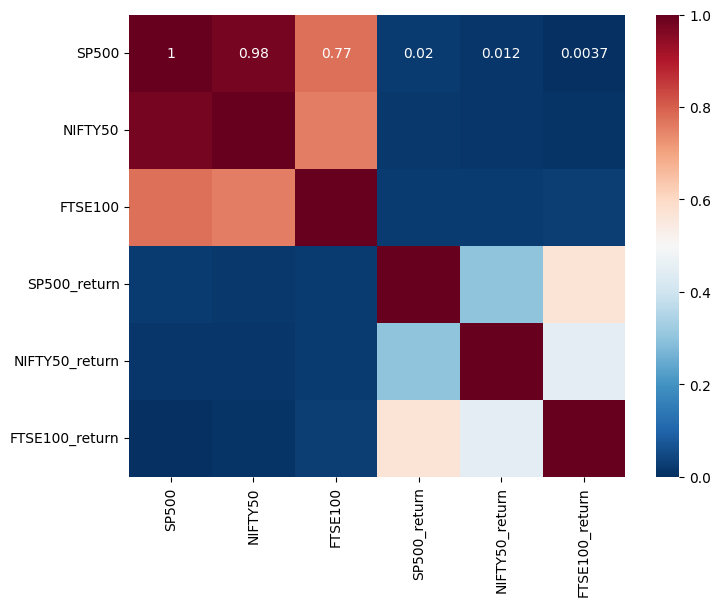

In [10]:
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(df_corr.corr(), annot=True, cmap='RdBu_r', vmin=0, vmax=1, ax=ax)
plt.show()


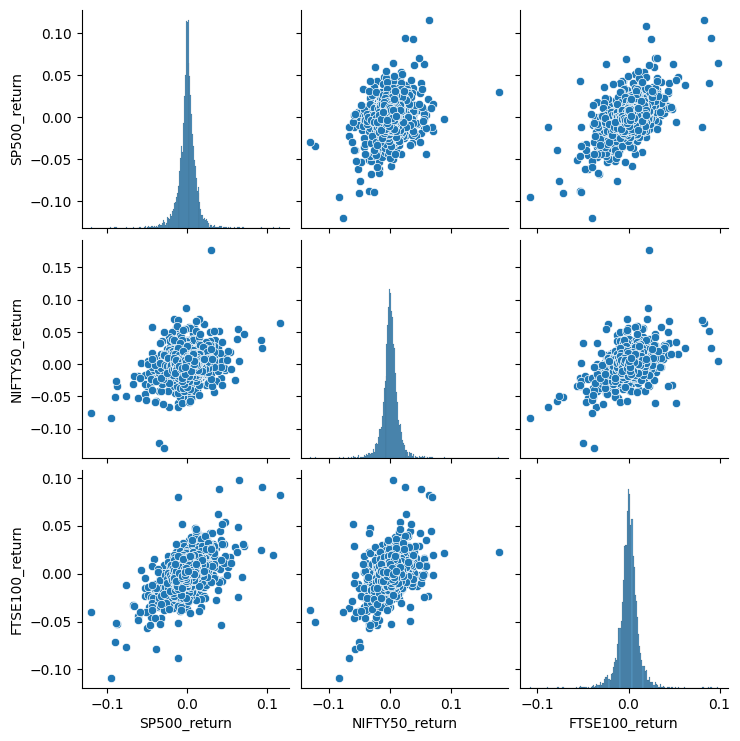

In [11]:
sns.pairplot(df_corr[['SP500_return', 'NIFTY50_return', 'FTSE100_return']])

In [12]:
display(round(df_corr[['SP500_return', 'NIFTY50_return', 'FTSE100_return']].corr(),2))

,SP500_return,NIFTY50_return,FTSE100_return
SP500_return,1.00,0.30,0.57
NIFTY50_return,0.30,1.00,0.45
FTSE100_return,0.57,0.45,1.00


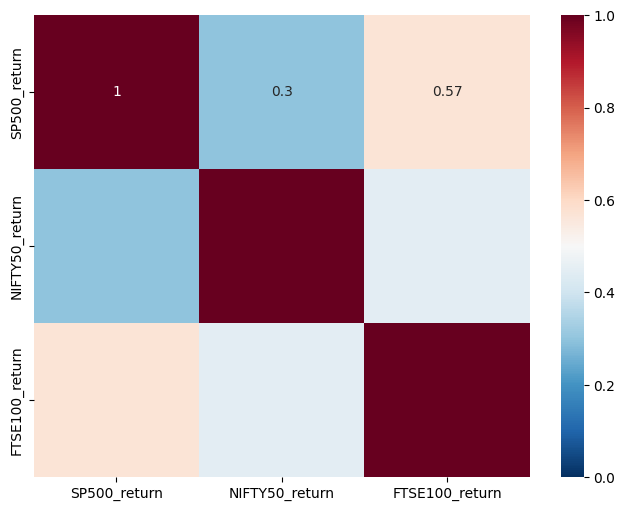

In [13]:
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(df_corr[['SP500_return', 'NIFTY50_return', 'FTSE100_return']].corr(), annot=True, cmap='RdBu_r', vmin=0, vmax=1, ax=ax)
plt.show()


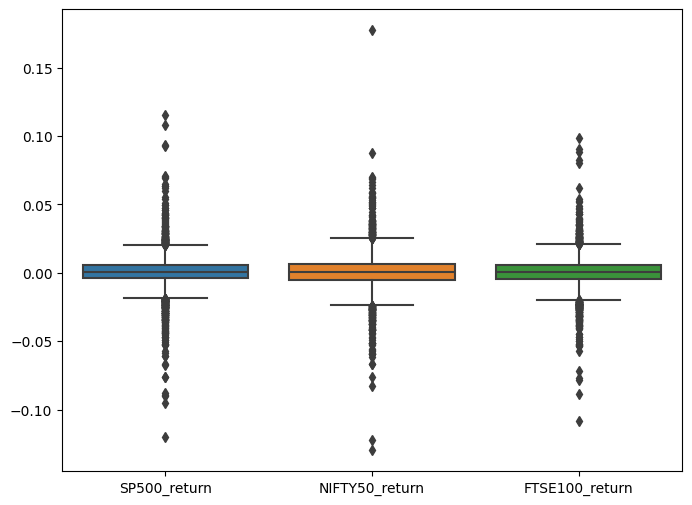

In [15]:
#create boxplots of all the returns

fig, ax = plt.subplots(figsize=(8, 6))
sns.boxplot(data=df_corr[['SP500_return', 'NIFTY50_return', 'FTSE100_return']], ax=ax)
plt.show()


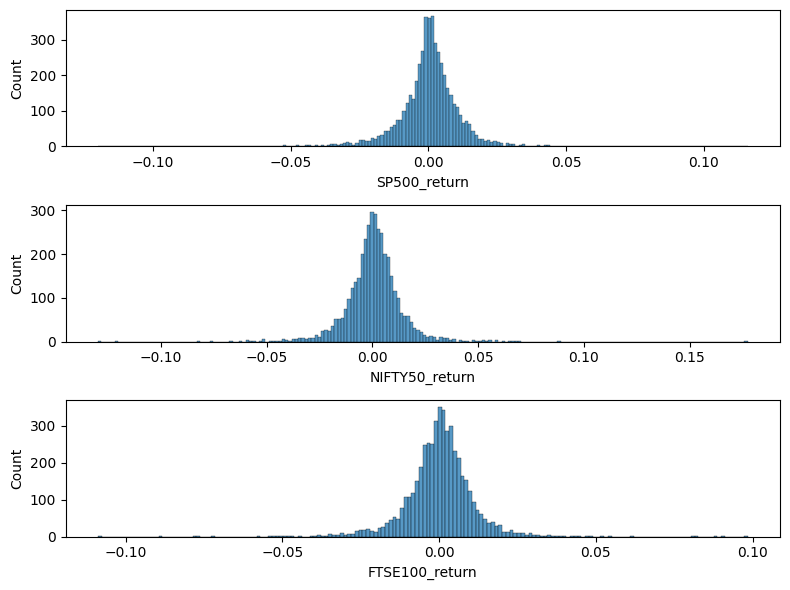

In [20]:
#create 3 histograms of all the returns

fig, ax = plt.subplots(3, 1, figsize=(8, 6))
sns.histplot(df_corr['SP500_return'], ax=ax[0])
sns.histplot(df_corr['NIFTY50_return'], ax=ax[1])
sns.histplot(df_corr['FTSE100_return'], ax=ax[2])
plt.tight_layout()
plt.show()







In [ ]:
def decomposition_plot(ts):
# Apply seasonal_decompose 
    decomposition = seasonal_decompose(ts, period =255)
    
# Get trend, seasonality, and residuals
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

# Plotting
    plt.figure(figsize=(12,8))
    plt.subplot(411)
    plt.plot(np.log(ts), label='Original', color='blue')
    plt.legend(loc='best')
    plt.subplot(412)
    plt.plot(trend, label='Trend', color='blue')
    plt.legend(loc='best')
    plt.subplot(413)
    plt.plot(seasonal,label='Seasonality', color='blue')
    plt.legend(loc='best')
    plt.subplot(414)
    plt.plot(residual, label='Residuals', color='blue')
    plt.legend(loc='best')
    plt.tight_layout()

In [ ]:
decomposition_plot(df.Weighted_price)
decomposition_plot(df.Weighted_price.diff().dropna())

In [ ]:
def stationarity_check(ts):
            
    # Calculate rolling statistics
    roll_mean = ts.rolling(window=8, center=False).mean()
    roll_std = ts.rolling(window=8, center=False).std()

    # Perform the Dickey Fuller test
    dftest = adfuller(ts) 
    
    # Plot rolling statistics:
    fig = plt.figure(figsize=(12,6))
    orig = plt.plot(ts, color='blue',label='Original')
    mean = plt.plot(roll_mean, color='red', label='Rolling Mean')
    std = plt.plot(roll_std, color='green', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    # Print Dickey-Fuller test results

    print('\nResults of Dickey-Fuller Test: \n')

    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', 
                                             '#Lags Used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

In [ ]:
stationarity_check(df.Weighted_price)
stationarity_check(df.Weighted_price.diff().dropna())

In [ ]:
def normality_check(ts):
    # Normality test
    ts = ts.dropna()
    ts_1st_diff = ts.diff().dropna()
    jb_test = jarque_bera(ts)
    norm_test = normaltest(ts)
    jb_test_1st_diff = jarque_bera(ts_1st_diff)
    norm_test_1st_diff = normaltest(ts_1st_diff)
    
    print('Jarque-Bera Test ---- statistic: {}, p-value: {}'.format(jb_test[0], jb_test[1]))
    print('Normal Test ---- statistic: {}, p-value: {}'.format(norm_test[0], norm_test[1]))
    print('Jarque-Bera Test 1st diff ---- statistic: {}, p-value: {}'.format(jb_test_1st_diff[0], jb_test_1st_diff[1]))
    print('Normal Test 1st diff ---- statistic: {}, p-value: {}'.format(norm_test_1st_diff[0], norm_test_1st_diff[1]))